# Multi-class dogs and cats breed classification

Builds a multi-class classifier for image data using TensorFlow and TensorFlow Hub. Specifically, we will use transfer learning by adding a custom layer to the TF2.0 v4 model from TensorFlow Hub, which is trained for image classification problems using MobileNetV2 - a convolutional neural network architecture.

## 1. Problem
Identify breed of dog or cat given an image.

## 2. Data
Data is from Kaggle: https://www.kaggle.com/datasets/imsparsh/animal-breed-cats-and-dogs

Originally from the dockship "Animal Breed Classification AI Challenge":
https://dockship.io/challenges/5fdcba715f392d4d66289d43/animal-breed-classification-ai-challenge/overview

## 3. Evaluation
Metrics to consider:
- Accuracy
- F1 score
- Log-loss

Competition uses F1 accuracy score.

## 4. Features
Images (unstructured data). Use deep learning/transfer learning.

"The dataset contains images of 37 breeds of cats and dogs from around the world. It contains two directories "TRAIN" and "TEST" with 5890 and 1500 images respectively. The training images are provided in the directory of the specific class itself. The names of the directories are "class labels" to be used for submission. The aim is to classify the "TEST" images into one of the 37 classes."

## Preparing Workspace

In [1]:
# Import TensorFlow, TensorFlowHub
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
import os
import csv
# Check gpu availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available, change runtime type in Colab")

GPU available


## Reformatting images

Want to arrange all images into one place with distinct names and with a dataframe linking the image name to it's corresponding label.

Only need to do this once. If images are already saved in desired form, then don't run this function.

In [ ]:
import os
import shutil

def format_images(rootdir = '/content/drive/MyDrive/Dog_Cat_Breeds/archive/Cats-and-Dogs-Breed-Dataset-main/TRAIN', 
                  newdir='/content/drive/MyDrive/Dog_Cat_Breeds/TRAIN_sorted_and_labelled'):
    '''
    Images are initially in folders within the 'rootdir'. As downloaded from Kaggle, the folder names tell us the label 
    (i.e. breed). Then, images in each folder (of a particular breed) are just numbered from 1.
    We want to have all the images in one folder ('newdir') so that we can import and shuffle images from one place. 
    We also would like the names of the image files tell us information about breed for quick exploration.
    We wnat a file that can be used to link each image to it's corresponding label.
    This function takes the 'rootdir' where the untransformed image file structure is located, renames images, generates a 
    labels csv file and adds these to a new target directory, 'newdir'.
    '''

    ids = []
    breeds = []

    os.makedirs(newdir, exist_ok=True)
    # create array of labels (subdirectory folder names)
    sub_folders = [name for name in os.listdir(rootdir) if os.path.isdir(os.path.join(rootdir, name))]
    print(sub_folders)

    for sub_folder in sub_folders: # loop through subfolders (the ones with the label names)
        sub_rootdir = rootdir+"/"+sub_folder # switch root directory to the subfolder
        for subdir, dirs, files in os.walk(sub_rootdir): # get files within subfolder (the images)
            for file in files: # loop through files (images)
                old_name = os.path.join(subdir, file) # path of original image with original name
                new_name = os.path.join(newdir,sub_folder+file) # path to copy image to, with new name
                shutil.copy(old_name, new_name) # copy image to new path
                ids.append(sub_folder+file) # add id (image path name) to list for labels dataframe
                breeds.append(sub_folder) # add corresponding breed to list for labels dataframe

    labels = pd.DataFrame({"id":ids, "breed":breeds})
    labels.to_csv(newdir+'/labels.csv',index=False)


## Preparing the Data

- Import and shuffle filepaths and associated labels.
- Transform breed labels into numbers/categories (boolean arrays).
- Turn images into tensors.

### Import and shuffle filepaths and associated labels.

In [2]:
from sklearn.utils import shuffle
path = '/content/drive/MyDrive/Dog_Cat_Breeds/TRAIN_sorted_and_labelled'
labels_csv = shuffle(pd.read_csv(path+'/labels.csv'),random_state=10).reset_index() # shuffle the images
print(labels_csv.describe())
labels_csv.head()

             index
count  5890.000000
mean   2944.500000
std    1700.440874
min       0.000000
25%    1472.250000
50%    2944.500000
75%    4416.750000
max    5889.000000


,index,id,breed
0,3634,saint_bernard8.jpg,saint_bernard
1,4126,russian_blue89.jpg,russian_blue
2,3929,pug56.jpg,pug
3,2745,keeshond144.jpg,keeshond
4,5198,siamese33.jpg,siamese


<Axes: >

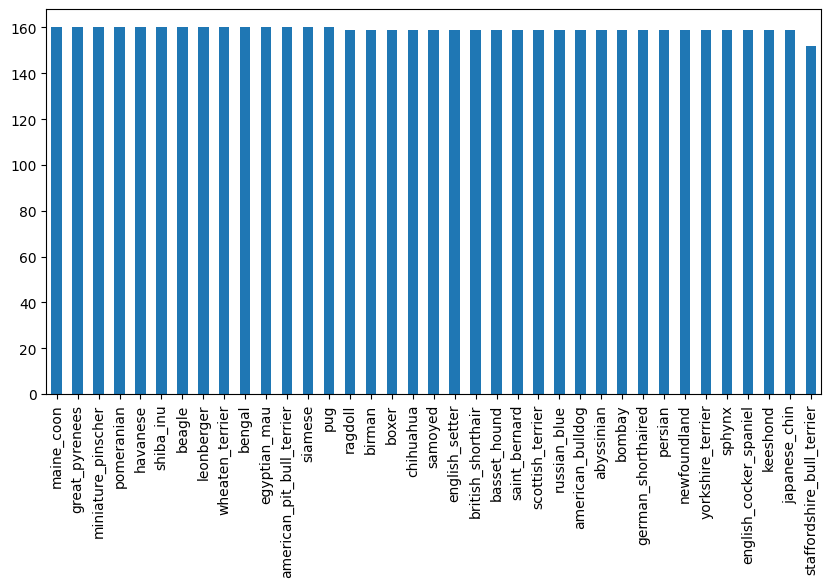

In [3]:
# Check number of cases of each target label
labels_csv["breed"].value_counts().plot.bar(figsize=(10,5))
# Look's like we've got a consistent number of examples for each class and > 100! :)

In [4]:
# Extract pathnames from ID in labels_csv
filenames = [path+"/"+filename for filename in labels_csv["id"]]
print("There are "+str(len(filenames))+" image filenames")

There are 5890 image filenames


### Transform breed labels into numbers/categories (boolean arrays).

In [5]:
# Extract labels from breed in labels_csv
labels = labels_csv["breed"].to_numpy()
# Find the unique breeds
unique_labels = np.unique(labels)
# Turn the label for each image into a boolean array where the position of 'True' correpsonds to the position of the label in 'unique_labels'
boolean_labels = [label == unique_labels for label in labels]
print("There are "+str(len(boolean_labels))+" labels")
if len(boolean_labels) == len(filenames):
  print("Number of labels matches number of images")
else:
  print("Error: Number of labels doesn't match number of images")

There are 5890 labels
Number of labels matches number of images


In [6]:
print(unique_labels)

['abyssinian' 'american_bulldog' 'american_pit_bull_terrier'
 'basset_hound' 'beagle' 'bengal' 'birman' 'bombay' 'boxer'
 'british_shorthair' 'chihuahua' 'egyptian_mau' 'english_cocker_spaniel'
 'english_setter' 'german_shorthaired' 'great_pyrenees' 'havanese'
 'japanese_chin' 'keeshond' 'leonberger' 'maine_coon' 'miniature_pinscher'
 'newfoundland' 'persian' 'pomeranian' 'pug' 'ragdoll' 'russian_blue'
 'saint_bernard' 'samoyed' 'scottish_terrier' 'shiba_inu' 'siamese'
 'sphynx' 'staffordshire_bull_terrier' 'wheaten_terrier'
 'yorkshire_terrier']


In [7]:
# save the unique labels as a csv
with open('/content/drive/MyDrive/Dog_Cat_Breeds/unique_labels.csv', 'w', newline='') as f:
    # using csv.writer method from CSV package
    write = csv.writer(f)
    write.writerow(unique_labels)

Testing/checking the labelling system

saint_bernard
['abyssinian' 'american_bulldog' 'american_pit_bull_terrier'
 'basset_hound' 'beagle' 'bengal' 'birman' 'bombay' 'boxer'
 'british_shorthair' 'chihuahua' 'egyptian_mau' 'english_cocker_spaniel'
 'english_setter' 'german_shorthaired' 'great_pyrenees' 'havanese'
 'japanese_chin' 'keeshond' 'leonberger' 'maine_coon' 'miniature_pinscher'
 'newfoundland' 'persian' 'pomeranian' 'pug' 'ragdoll' 'russian_blue'
 'saint_bernard' 'samoyed' 'scottish_terrier' 'shiba_inu' 'siamese'
 'sphynx' 'staffordshire_bull_terrier' 'wheaten_terrier'
 'yorkshire_terrier']
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0]


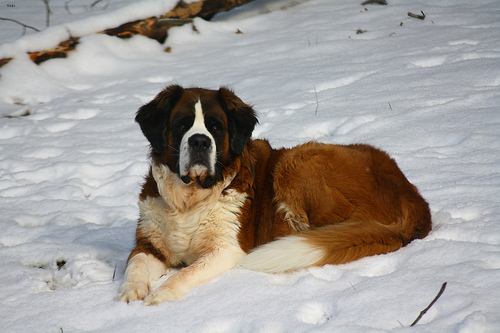

In [8]:
# Any example image index
example_index = 5
# Original label example
print(labels[example_index])
# Unique labels
print(unique_labels)
# New (boolean) label, the True (1) should correspond to the position of the original label in unqiue_labels
print(boolean_labels[example_index].astype(int))

# View Image
from IPython.display import Image
Image(filenames[example_index])

### Define X and y and reduced number of samples to take for experimentation.

In [9]:
X = filenames # data
y = boolean_labels # labels

# Reduced number of images for increased speed of experimentation
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:5000, step:100}

### Split data into training and validation on the reduced number of samples

In [10]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state = 10)

len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

### Preprocess images (turn to tensors)

Function will:
1. Take image filepath as input.
2. Read the file (jpg image) and save to variable using TensorFlow.
3. Turn image (jpg) into Tensors.
4. Resize the image for consistency in shape.
5. Return modified image.

Exploring image structure in NumPy

In [13]:
# Convert image to NumPy array, purely for exploratory purposes here
from matplotlib.pyplot import imread
image = imread(filenames[5]) # read in image as numpy array
print(image.shape) # shape will be n*m*3. n number of pixels vertically, m number of pixels horizontally, and 3 colour channels (RGB) for each pixel
# tf.constant(image) # Converts array to tensor for use in tensorflow, for running on gpu

(333, 500, 3)


Building function

In [14]:
# Define image size
IMG_SIZE = 224 # for transfer learning, ensure image size is of the correct size for the model (same as size used in training of transferred model)

def process_image(image_path):
  """
  Turns image from input filepath into a Tensor
  """

  image = tf.io.read_file(image_path) # returns a tensor with the entire contents of the input filename.
  # Turn jpg image into numerical Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image, channels=3) #### Note, at this point we have the same as if we had used the imread and tf.constant method above
  # Convert colour channel values from 0-255 to 0-1 values (RGB values are 0-255 as standard)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


## Turning data into batches

Batches are used to allow processing of images in smaller chunks, not overloading the memory.

"While the use of large mini-batches increases the available computational parallelism, small batch training has been shown to provide
improved generalization performance and allows a significantly smaller memory
footprint, which might also be exploited to improve machine throughput"

"the best results have been obtained with batch sizes m = 32 or smaller"

https://arxiv.org/abs/1804.07612

First, need to get data in form of Tensor tuples '(image, label)' for use in TensorFlow

In [15]:
def get_image_label(image_path,label):
  """
  Creates tuple of (image, label) from input image filepath and label
  """
  image = process_image(image_path)
  return image, label

Function to turn data into transformed batches

In [16]:
# Define batch size
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data from image (X) and label (y) pairs.
  Shuffles data if training data but not if validation data.labels.
  Accepts data with no labels (test_data).
  """
  if test_data:
    print("Creating test data batches...")
    # Create Dataset
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)) # only filepaths (no labels)
    # Turn Dataset into batches
    data_batch = data.map(process_image).batch(BATCH_SIZE) # .map applies the image processing function to all images in Dataset .batch creates batches
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),   # filepaths
                                               tf.constant(y)))  # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffle data before mapping image processor function (faster to just shuffle the filepaths than image tensor arrays)
    # Note, will shuffle everytime the dataset is called
    data = data.shuffle(buffer_size = len(X))

    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch



Create training and validation batches

In [17]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [18]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 37), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 37), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Display images in a batch.

In [19]:
import matplotlib.pyplot as plt

# Create function to view images in a data batch
def show_images(images, labels):
  """
  Displays images and labels
  """
  plt.figure(figsize=(10,10))
  imax = len(labels)
  for i in range(imax):
    ax = plt.subplot(int(np.ceil(np.sqrt(imax))), int(np.ceil(np.sqrt(imax))), i+1)
    # Display image
    plt.imshow(images[i])
    # Show image label in title
    plt.title(unique_labels[labels[i].argmax()])
    plt.axis("off")


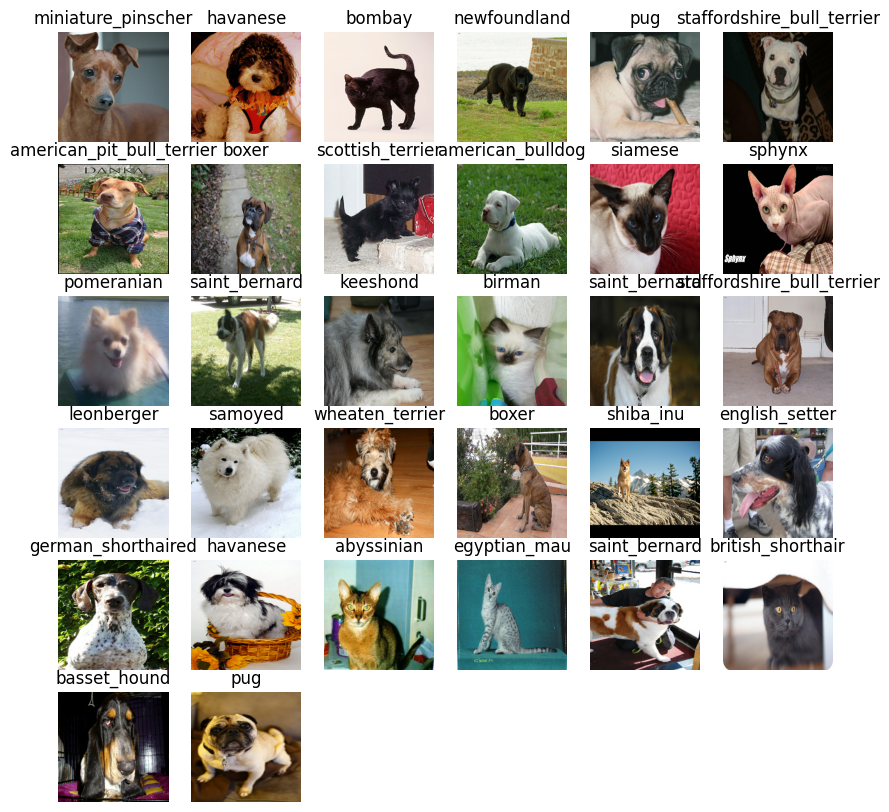

In [20]:
train_images, train_labels = next(train_data.as_numpy_iterator()) # unbatch as numpy arrays
show_images(train_images, train_labels)

## Building model

First need to define:
- Input shape (shape of images, in the form of tensors) to model.
- Output shape (image labels, in the form of tensors) of model.
- URL of model we want to use.

### Set up inputs and outputs

In [21]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape
OUTPUT_SHAPE = len(unique_labels)

### Setup model from TensorFlow Hub

1) Import model with model URL.
---

"TensorFlow Hub is a repository of trained machine learning models ready for fine-tuning and deployable anywhere."

We will use a MobileNetv2 model:

---

"MobileNet V2 is a family of neural network architectures for efficient on-device image classification and related tasks, originally published by

Mark Sandler, Andrew Howard, Menglong Zhu, Andrey Zhmoginov, Liang-Chieh Chen: "Inverted Residuals and Linear Bottlenecks: Mobile Networks for Classification, Detection and Segmentation", 2018.
Mobilenets come in various sizes controlled by a multiplier for the depth (number of features) in the convolutional layers. They can also be trained for various sizes of input images to control inference speed.

This TF-Hub module uses the TF-Slim implementation of mobilenet_v2 with a depth multiplier of 1.0 and an input size of 224x224 pixels.

The module contains a trained instance of the network, packaged to do the image classification that the network was trained on."


---

2) Use Keras to build model.
---
"Keras is a deep learning API written in Python, running on top of the machine learning platform TensorFlow. It was developed with a focus on enabling fast experimentation." https://keras.io/about/



In [22]:
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

Put inputs, outputs and model together into a Keras deep learning model

Create function to:
- Take input shape, output shape and TF Hub model as parameters.
- Define layers in a Keras model in a sequential fashion.
- Compile the model (says how it should be evaluated or improved).
- Build the model (tell the model the input shape it'll be getting).
- Return the model.

https://www.tensorflow.org/guide/keras/sequential_model

Note on metrics used in 'compile':

"A metric is a function that is used to judge the performance of your model.
Metric functions are similar to loss functions, except that the results from evaluating a metric are not used when training the model. Note that you may use any loss function as a metric."
Logs the metric for your viewing.

The loss parameter is used in training the model:

"CategoricalCrossentropy class: Computes the crossentropy loss between the labels and predictions.
Use this crossentropy loss function when there are two or more label classes. We expect labels to be provided in a one_hot representation."

In [23]:
# Create function which builds Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
          hub.KerasLayer(model_url), # Layer 1 (input layer)
          tf.keras.layers.Dense(units=output_shape,
                                activation ="softmax") # Layer 2 (output layer)
  ])

  # Compile model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )
  # Build model
  model.build(input_shape)

  return model

In [24]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 37)                37074     
                                                                 
Total params: 3,577,339
Trainable params: 37,074
Non-trainable params: 3,540,265
_________________________________________________________________


## Creating Callbacks

Helper functions that a model can use during training to do things such as: save progress, check progress, stop training early if model stops improving.

Create 2:
1. For TensorBoard, which helps track models progress.
2. For early stopping, which prevents model from training for too long (i.e. wasting time and/or overfitting).

### TensorBoard callback

1. Load TensorBoard extension
2. Creat TensorBoard callback which is able to save logs to a directory and pass it to model's `fit()` function.
3. Visualize models training logs with the `%tensorboard` magic function (to do after model training)

In [25]:
# Load TensorBoard extension
%load_ext tensorboard

In [26]:
import datetime

def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog_Cat_Breeds/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # creates path in logs folder with current datetime
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Helps to stop model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [27]:
# create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3) # Once val_accuracy stops improving for 3 epochs, stop training

## Training a Model (on subset)

First model will train on reduced (NUM_IMAGES = 1000) number of images, to make sure everything works and for experimentation.

In [28]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [29]:
# Check gpu still running
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available, change runtime type in Colab")

GPU available


### Create function to train a model.

- Create a model using `create_model()`
- Setup a TensorBoard callback using `create_tensorboard_callback()`
- Call the `fit()` function on model, passing in the training data, validation data, number of epochs and the callbacks
- Return the model

In [30]:
def train_model():
  """
  Trains a model and returns the trained version
  """
  # create model
  model = create_model()

  # create new TensorBoard session each time we train model
  tensorboard_cb = create_tensorboard_callback()

  # fit model to the data
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard_cb, early_stopping])

  # return the fitted model
  return model

In [31]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 381s 15s/step - loss: 2.8560 - accuracy: 0.3025 - val_loss: 1.3772 - val_accuracy: 0.6350
Epoch 2/100
25/25 [==============================] - 4s 144ms/step - loss: 0.7073 - accuracy: 0.8200 - val_loss: 0.6620 - val_accuracy: 0.8300
Epoch 3/100
25/25 [==============================] - 4s 164ms/step - loss: 0.3051 - accuracy: 0.9450 - val_loss: 0.5327 - val_accuracy: 0.8650
Epoch 4/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1840 - accuracy: 0.9725 - val_loss: 0.4837 - val_accuracy: 0.8650
Epoch 5/100
25/25 [==============================] - 4s 142ms/step - loss: 0.1229 - accuracy: 0.9887 - val_loss: 0.4627 - val_accuracy: 0.8800
Epoch 6/100
25/25 [==============================] - 4s 181ms/step - loss: 0.0885 - accuracy: 1.0000 - val_loss: 0.4432 - val_accuracy: 0.8800
Epoch 7/100
25/25 [==============================] - 4

### Check the TensorBoard logs

TensorBoard magic function (`%tensorboard`) will access the logs directory we have created and visualise its contents.

In [32]:
%tensorboard --logdir /content/drive/MyDrive/Dog_Cat_Breeds/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [33]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose=1)
predictions.shape # number of validation cases, number of unique labels. predictions gives probabilities of each label (softmax)

7/7 [==============================] - 21s 99ms/step


(200, 37)

In [35]:
# Compare single case of predicted label vs actual label
index = 10
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_labels[np.argmax(predictions[index])]}")
print(f"Actual label: {unique_labels[np.argmax(y_val[index])]}")

Max value (probability of prediction): 0.7371358275413513
Max index: 6
Predicted label: birman
Actual label: birman


In [36]:
# Turn prediction probabilities into the predicted label
def get_pred_label(prediction_probabilites):
  return unique_labels[np.argmax(prediction_probabilites)]

### Unbatch validation set and visualise predictions

Validation data is still in a batch dataset. Need to unbatch to make predictions on validation set and then compare to true validation labels

In [37]:
# Function to unbatch dataset
def unbatch_set(data):
  """
  Takes a batched data set of (images, labels) Tensors and return seperate arrays of images and labels, unbatched
  """
  images_ = [] # create separate arrays for images and labels
  labels_ = []

  # Loop through unbatched data, (.unbatch() does the unbatching)
  for image, label in data.unbatch().as_numpy_iterator():
   images_.append(image)
   labels_.append(label)

  return images_, labels_

# Unbatch and seperate (images from labels) validation data
val_images, val_labels = unbatch_set(val_data)

Create function to:
- Take array of prediction probabilities, array of ture labels, and an integer (of which sample from array to plot).
- Plot predicted probability, predicted label, true label, image

In [38]:
def plot_pred(prediction_probabilities, labels_true, images, n=1):
  pred_prob, true_label, image = prediction_probabilities[n], labels_true[n], images[n]
  # Get predicted label from probabilities
  pred_label = get_pred_label(pred_prob)
  # Can use the same function to get the actual label in written form
  true_label = get_pred_label(true_label)
  # Plot image
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    colour_test = "green"
  else:
    colour_test = "red"

  plt.title("Pred: {}, True: {}, Conf: {:2.0f}%".format(pred_label, true_label, np.max(pred_prob)*100), color = colour_test)

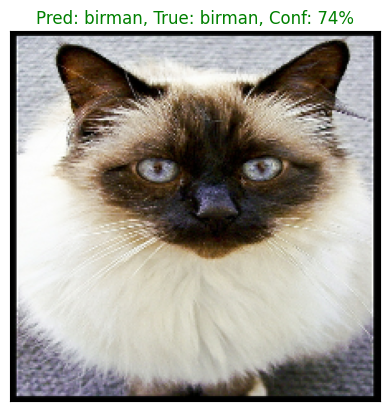

In [42]:
plot_pred(predictions, val_labels, val_images, n=10)

Create function to view models top 5 predictions.

In [40]:
def plot_top_preds(prediction_probabilities, labels_true, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels_true[n]

  # Get predicted label
  pred_label = get_pred_label(pred_prob)
  # Get true label
  true_label = get_pred_label(true_label)

  # Find top 5 prediction confidence indices
  top_5_indices = pred_prob.argsort()[-5:][::-1]
  # argsort gives indices to sort i.e. indices corresponding to min val to max
  # [-10:] takes the last 5 (corresponding to the largest)
  # [::-1] reverses order so that highest prob is first after selecting the 5 highest

  # Top 5 prediction confidence values
  top_5_preds = pred_prob[top_5_indices]
  # Top 5 prediction lables
  top_5_pred_labels = unique_labels[top_5_indices]

  # Plot
  top_5_plot = plt.bar(np.arange(len(top_5_pred_labels)),
                       top_5_preds,
                       color="grey")
  plt.xticks(np.arange(len(top_5_pred_labels)),
             labels = top_5_pred_labels,
             rotation = "vertical")
  # Change colour of true label
  if np.isin(true_label, top_5_pred_labels):
    top_5_plot[np.argmax(top_5_pred_labels == true_label)].set_color("green")


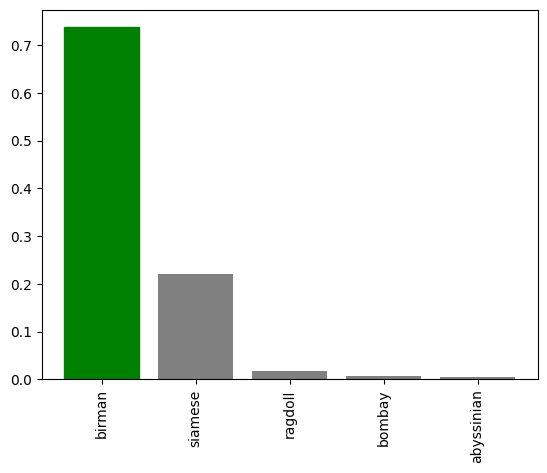

In [43]:
plot_top_preds(predictions, val_labels, n=10)

Check out a few examples together

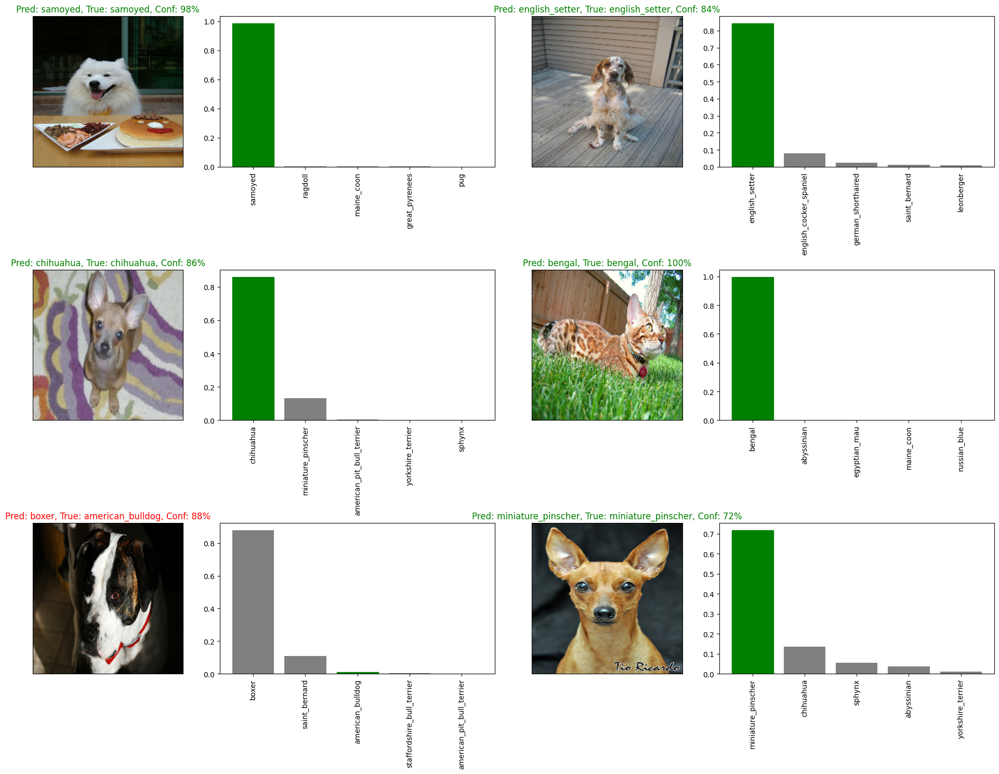

In [44]:
i_iterate = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels_true = val_labels,
            images = val_images,
            n = i+i_iterate)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_top_preds(prediction_probabilities = predictions,
                labels_true = val_labels,
                n = i+i_iterate)
  plt.tight_layout()

plt.show()

## Saving and loading a trained model

Create functions to save and load model

In [45]:
def save_model(model, suffix=None):
  """
  Saves passed model in models directory with appended suffix
  """
  # Create pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog_Cat_Breeds/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "_" + suffix + ".h5" # .h5 file format extension
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

def load_model(model_path):
  """
  Loads model from input path
  """
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer}) # custom objects used to tell Keras that there is an additional (custom) layer (from training)

  return model


## Train model on full data

In [46]:
# Create data batch with full data set
# Here I will still split off a separate validation set to use for testing
X_full, X_test, y_full, y_test = train_test_split(X,
                                                  y,
                                                  test_size = 0.2,
                                                  random_state = 10)
# Create data batches
full_data = create_data_batches(X_full,y_full)
# Create model
full_model = create_model()
# Create model callbacks
# Tensorboard callback
full_model_tensorboard = create_tensorboard_callback()
# Early stopping callback (don't have validation accuracy when training using full set, monitor test accuracy)
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

Creating training data batches...
Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


Training cell below commented out, uncomment if need to retrain. Other wise, use following cell to load pretrained model

In [ ]:
# # Fit model to full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard,full_model_early_stopping])

# # Save
# save_model(full_model, suffix="trained_on_80percent")

In [47]:
# Load saved model
full_model = load_model("/content/drive/MyDrive/Dog_Cat_Breeds/models/20220815-18301660588220_trained_on_80percent.h5")

Loading saved model from: /content/drive/MyDrive/Dog_Cat_Breeds/models/20220815-18301660588220_trained_on_80percent.h5...


## Make predictions on test set

Will need test data in Tensor batches so the format is the same as used in training.

In [48]:
# Create test data batches
test_data = create_data_batches(X_test,test_data=True)
# Make predictions on test data batch using the loaded full model
test_predictions = full_model.predict(test_data,verbose=1)

Creating test data batches...
37/37 [==============================] - 371s 10s/step


In [49]:
test_predictions.shape

(1178, 37)

In [50]:
# Convert probability labels to text
pred_labels = [get_pred_label(test_predictions[i]) for i in range(np.size(test_predictions, axis=0))]
true_labels = [get_pred_label(y_test[i]) for i in range(np.size(y_test, axis=0))]
len(pred_labels), len(true_labels)


(1178, 1178)

## Evaluate performance on test set

F1 Score (metric used in competition)

In [51]:
from sklearn.metrics import f1_score, confusion_matrix, ConfusionMatrixDisplay, accuracy_score

f1_weighted = f1_score(true_labels, pred_labels, labels=unique_labels, average="weighted")
f1_micro = f1_score(true_labels, pred_labels, labels=unique_labels, average="micro")
f1_macro = f1_score(true_labels, pred_labels, labels=unique_labels, average="macro")
accuracy = accuracy_score(true_labels, pred_labels)

In [52]:
print("f1 scores: weighted, {:1.4f}; mirco, {:1.4f}; macro, {:1.4f}; accuracy {:1.4f}.".format(f1_weighted, f1_micro, f1_macro, accuracy))

f1 scores: weighted, 0.8996; mirco, 0.8998; macro, 0.9005; accuracy 0.8998.


Confusion Matrix

<Axes: >

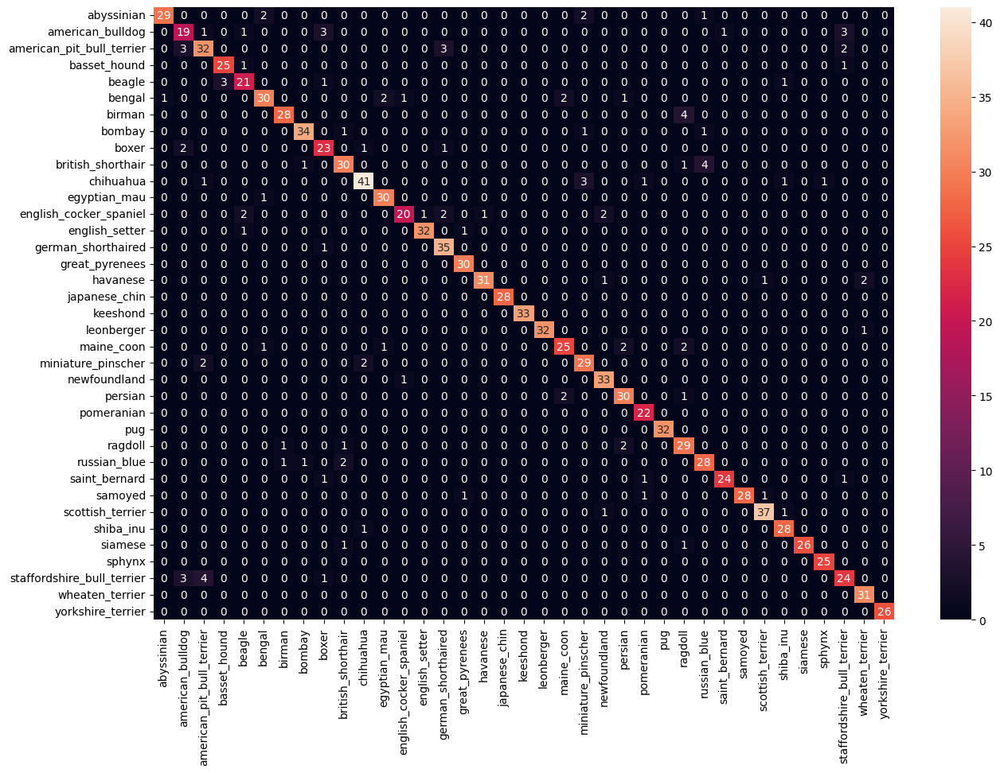

In [55]:

import seaborn as sns
cm = confusion_matrix(true_labels, pred_labels, labels=unique_labels)
cm_display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = unique_labels)


df_cm = pd.DataFrame(cm, index = [i for i in unique_labels],
                  columns = [i for i in unique_labels])
plt.figure(figsize = (15,10))
sns.heatmap(df_cm, annot=True)